# Economic Data Analysis with FRED API

We will look at **unemployment rates and participation rates of every state in the USA** using the [FRED API](https://fredhelp.stlouisfed.org/fred/about/about-fred/what-is-fred/).

# 1. Request for FRED API Key

To get your own FRED API key:

1. Register for an account in [FRED](https://fred.stlouisfed.org/docs/api/fred/)
2. Go to `My Account > API Keys`
3. Click the Request API Key button
4. Copy the API key generated for your account

After doing those steps, you then have to paste your API key inside a `.py` file within a variable name of your choice.

You can then proceed to import the libraries required for analysis, and the API key from [FRED](https://fred.stlouisfed.org/docs/api/fred/)

# 2. Import libraries

In [1]:
# Data manipulation
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', 500)

# Plotting
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

# Plot aesthetics
plt.style.use('fivethirtyeight')
color_pal = plt.rcParams['axes.prop_cycle'].by_key()['color']

# Import `fredapi` and api key
from fredapi import Fred
import creds

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

# 3. Create Fred object

We create a `fred` object here and load the api key as well.

In [2]:
fred = Fred(api_key=creds.api_key)
fred

# 4. Begin Search for Economic Data

We'll just test here how the FRED API's `.search()` method works.

In [3]:
nasdaq_search = fred.search('NASDAQ', order_by='popularity')
nasdaq_search.head()

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
SP500,SP500,2023-11-28,2023-11-28,S&P 500,2013-11-29,2023-11-27,"Daily, Close",D,Index,Index,Not Seasonally Adjusted,NSA,2023-11-27 19:11:03-06:00,83,The observations for the S&P 500 represent the...
NASDAQCOM,NASDAQCOM,2023-11-28,2023-11-28,NASDAQ Composite Index,1971-02-05,2023-09-25,"Daily, Close",D,"Index Feb 5, 1971=100","Index Feb 5, 1971=100",Not Seasonally Adjusted,NSA,2023-09-26 07:07:02-05:00,69,The observations for the NASDAQ Composite Inde...
NASDAQ100,NASDAQ100,2023-11-28,2023-11-28,NASDAQ 100 Index,1986-01-02,2023-09-25,"Daily, Close",D,Index,Index,Not Seasonally Adjusted,NSA,2023-09-26 07:07:01-05:00,57,The observations for the NASDAQ 100 Index repr...
VXNCLS,VXNCLS,2023-11-28,2023-11-28,CBOE NASDAQ 100 Volatility Index,2001-02-02,2023-11-24,"Daily, Close",D,Index,Index,Not Seasonally Adjusted,NSA,2023-11-27 08:36:05-06:00,38,"Copyright, 2016, Chicago Board Options Exchang..."


In [4]:
nasdaq_search.shape

(4, 15)

# 4.1 Pull raw data

Now we'll test pulling out data using the `.get_series()` method and make a quick plot.

<Axes: >

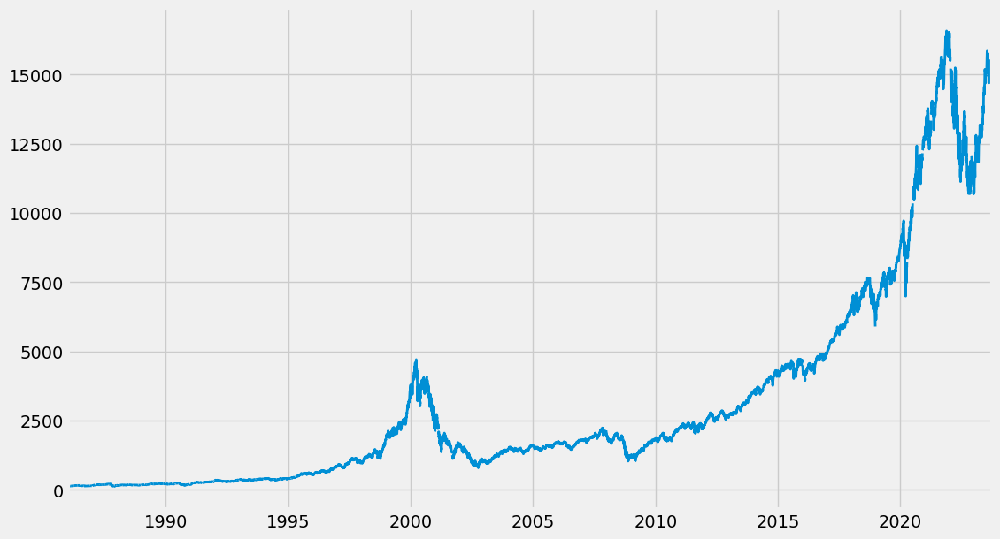

In [5]:
fred.get_series(series_id='NASDAQ100').plot(lw=2, figsize=(12, 7))

# II. Unemployment Rate Analysis

# 1. Pull and Join Multiple Data Series

Now let's pull some data for unemployment rates in the USA per state

In [6]:
unemployment_df = fred.search('unemployment rate state', filter=('frequency', 'Monthly'))
unemployment_df = unemployment_df.query('seasonal_adjustment == "Seasonally Adjusted" and' +
                                        ' units == "Percent"')
unemployment_df = unemployment_df.loc[unemployment_df['title'].str.contains('Unemployment Rate')]
unemployment_df

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
UNRATE,UNRATE,2023-11-28,2023-11-28,Unemployment Rate,1948-01-01,2023-10-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-11-03 07:50:02-05:00,94,The unemployment rate represents the number of...
LNS14000006,LNS14000006,2023-11-28,2023-11-28,Unemployment Rate - Black or African American,1972-01-01,2023-10-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-11-03 07:50:06-05:00,66,The series comes from the 'Current Population ...
CAUR,CAUR,2023-11-28,2023-11-28,Unemployment Rate in California,1976-01-01,2023-10-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-11-20 11:19:01-06:00,64,None
M0892AUSM156SNBR,M0892AUSM156SNBR,2023-11-28,2023-11-28,Unemployment Rate for United States,1929-04-01,1942-06-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2012-08-17 14:26:06-05:00,53,Series Is Presented Here As Three Variables--(...
M0892BUSM156SNBR,M0892BUSM156SNBR,2023-11-28,2023-11-28,Unemployment Rate for United States,1940-01-01,1946-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2012-08-17 14:29:19-05:00,11,Series Is Presented Here As Three Variables--(...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
M08311USM156SNBR,M08311USM156SNBR,2023-11-28,2023-11-28,"Unemployment Rate, Married Males, Spouse Prese...",1954-11-01,1968-01-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2012-08-17 14:28:17-05:00,3,Beginning In 1960 Data Include Alaska And Hawa...
CWSTUR,CWSTUR,2023-11-28,2023-11-28,Unemployment Rate in West Census Region,1976-01-01,2023-10-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-11-20 11:18:13-06:00,3,None
LNS14000015,LNS14000015,2023-11-28,2023-11-28,"Unemployment Rate - 16-19 Yrs., White",1954-01-01,2023-10-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-11-03 07:50:55-05:00,3,The series comes from the 'Current Population ...


In [7]:
all_results = []

for myid in unemployment_df.index:
    results = fred.get_series(myid)
    results = results.to_frame(name=myid)
    
    all_results.append(results)

In [8]:
type(all_results)

list

In [9]:
all_results[0]

,UNRATE
1948-01-01,3.4
1948-02-01,3.8
1948-03-01,4.0
1948-04-01,3.9
1948-05-01,3.5
...,...
2023-06-01,3.6
2023-07-01,3.5
2023-08-01,3.8
2023-09-01,3.8


In [10]:
all_results[1]

,LNS14000006
1972-01-01,11.2
1972-02-01,11.2
1972-03-01,10.7
1972-04-01,9.8
1972-05-01,10.2
...,...
2023-06-01,6.0
2023-07-01,5.8
2023-08-01,5.3
2023-09-01,5.7


We see here that `all_results` is a list containing DataFrames indexed by `datetime`. We then concatenate the list of DataFrames as columns to the `unemployment_results` DataFrame.

In [11]:
unemployment_results = pd.concat(all_results, axis=1)
unemployment_results

,UNRATE,LNS14000006,CAUR,M0892AUSM156SNBR,M0892BUSM156SNBR,NYUR,LNS14000024,TXUR,FLUR,U2RATE,LNS14000002,LNS14000031,LNS14000009,LNS14027662,LNS14027660,LNS14000003,LNS14000001,ALUR,LNS14024887,LRUN64TTUSM156S,ILUR,NCUR,PAUR,MIUR,OHUR,NJUR,KYUR,GAUR,MNUR,MAUR,LNS14000012,NMUR,LNS14027659,COUR,VAUR,WAUR,ORUR,MDUR,WIUR,AKUR,ARUR,SCUR,WVUR,UTUR,AZUR,TNUR,INUR,LAUR,IAUR,LNS14032183,NDUR,LNS14000036,NVUR,MOUR,LASMT261982000000003,NHUR,HIUR,PRUR,OKUR,LNS14000060,MSUR,MTUR,NEUR,KSUR,DCUR,LNS14000018,MEUR,CTUR,WYUR,IDUR,LASMT391746000000003,CMWRUR,DEUR,SDUR,LNS14000028,VTUR,LNS14024230,RIUR,LNS14000032,LNS14000315,CSOUUR,LRUN24TTUSM156S,LNS14027689,LNS14000026,LNS14000029,LNS14000150,CNERUR,LRUNTTTTUSM156S,LNS14200000,LNS14000048,CNEWUR,M08318USM156SNBR,LNS14000089,LNS14000061,LNS14000025,LNS14000049,LNS14000037,M08311USM156SNBR,CWSTUR,LNS14000015,LRUN25TTUSM156S,LNS14100000
1929-04-01,NaN,NaN,NaN,0.69,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-05-01,NaN,NaN,NaN,1.65,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-06-01,NaN,NaN,NaN,2.06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-07-01,NaN,NaN,NaN,0.79,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-08-01,NaN,NaN,NaN,0.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-01,3.6,6.0,4.6,NaN,NaN,3.9,3.3,4.1,2.6,1.7,3.4,5.9,4.3,2.0,3.9,3.1,3.7,2.2,7.5,3.635787,4.0,3.3,3.8,3.6,3.4,3.7,3.8,3.2,2.9,2.6,11.0,3.5,6.0,2.8,2.7,3.8,3.5,2.0,2.5,3.7,2.6,3.1,3.3,2.4,3.5,3.2,3.2,3.6,2.7,3.2,2.0,6.1,5.4,2.6,2.9,1.8,3.0,6.1,2.7,3.1,3.1,2.4,1.9,2.8,5.1,15.6,2.4,3.7,3.1,2.7,3.7,3.2,4.2,1.8,3.0,1.9,2.6,2.9,5.4,2.2,3.2,7.5,3.1,3.1,2.6,1.8,3.5,3.6,4.0,3.0,2.8,NaN,3.9,3.0,3.4,3.0,6.7,NaN,4.0,9.7,3.1,3.5
2023-07-01,3.5,5.8,4.6,NaN,NaN,3.9,3.2,4.1,2.7,1.6,3.4,5.3,4.4,2.0,3.4,3.1,3.6,2.1,8.0,3.637014,4.0,3.3,3.5,3.6,3.3,3.9,3.9,3.2,3.0,2.5,11.3,3.6,5.2,2.9,2.5,3.6,3.4,1.8,2.6,3.8,2.6,3

**US states** in the dataset are represented with **4 uppercase characters** instead of 2 in the naming convention. Here are some examples:

In [12]:
unemployment_df.loc['NYUR']  # Unemployment rate in New York

id                                                    NYUR
realtime_start                         2023-11-28 00:00:00
realtime_end                           2023-11-28 00:00:00
title                        Unemployment Rate in New York
observation_start                      1976-01-01 00:00:00
observation_end                        2023-10-01 00:00:00
frequency                                          Monthly
frequency_short                                          M
units                                              Percent
units_short                                              %
seasonal_adjustment                    Seasonally Adjusted
seasonal_adjustment_short                               SA
last_updated                     2023-11-20 11:19:02-06:00
popularity                                              52
notes                                                 None
Name: NYUR, dtype: object

In [13]:
unemployment_df.loc['MAUR']  # Unemploynent rate in Massachusetts

id                                                         MAUR
realtime_start                              2023-11-28 00:00:00
realtime_end                                2023-11-28 00:00:00
title                        Unemployment Rate in Massachusetts
observation_start                           1976-01-01 00:00:00
observation_end                             2023-10-01 00:00:00
frequency                                               Monthly
frequency_short                                               M
units                                                   Percent
units_short                                                   %
seasonal_adjustment                         Seasonally Adjusted
seasonal_adjustment_short                                    SA
last_updated                          2023-11-20 11:19:05-06:00
popularity                                                   30
notes                                                      None
Name: MAUR, dtype: object

In [14]:
unemployment_df.loc['NHUR']  # Unemployment rate in Hampshire

id                                                         NHUR
realtime_start                              2023-11-28 00:00:00
realtime_end                                2023-11-28 00:00:00
title                        Unemployment Rate in New Hampshire
observation_start                           1976-01-01 00:00:00
observation_end                             2023-10-01 00:00:00
frequency                                               Monthly
frequency_short                                               M
units                                                   Percent
units_short                                                   %
seasonal_adjustment                         Seasonally Adjusted
seasonal_adjustment_short                                    SA
last_updated                          2023-11-20 11:19:13-06:00
popularity                                                   19
notes                                                      None
Name: NHUR, dtype: object

Let's loop through the columns and filter out columns to drop with characters greater than 4. We can save this into a list and **drop fields that are not US States.**

In [15]:
columns_to_drop = []

for cols in unemployment_results.columns:
    if len(cols) > 4:
        columns_to_drop.append(cols)

columns_to_drop

['UNRATE',
 'LNS14000006',
 'M0892AUSM156SNBR',
 'M0892BUSM156SNBR',
 'LNS14000024',
 'U2RATE',
 'LNS14000002',
 'LNS14000031',
 'LNS14000009',
 'LNS14027662',
 'LNS14027660',
 'LNS14000003',
 'LNS14000001',
 'LNS14024887',
 'LRUN64TTUSM156S',
 'LNS14000012',
 'LNS14027659',
 'LNS14032183',
 'LNS14000036',
 'LASMT261982000000003',
 'LNS14000060',
 'LNS14000018',
 'LASMT391746000000003',
 'CMWRUR',
 'LNS14000028',
 'LNS14024230',
 'LNS14000032',
 'LNS14000315',
 'CSOUUR',
 'LRUN24TTUSM156S',
 'LNS14027689',
 'LNS14000026',
 'LNS14000029',
 'LNS14000150',
 'CNERUR',
 'LRUNTTTTUSM156S',
 'LNS14200000',
 'LNS14000048',
 'CNEWUR',
 'M08318USM156SNBR',
 'LNS14000089',
 'LNS14000061',
 'LNS14000025',
 'LNS14000049',
 'LNS14000037',
 'M08311USM156SNBR',
 'CWSTUR',
 'LNS14000015',
 'LRUN25TTUSM156S',
 'LNS14100000']

In [16]:
unemployment_states = unemployment_results \
    .drop(columns=columns_to_drop, axis=1) \
    .drop(columns='PRUR', axis=1)

unemployment_states

,CAUR,NYUR,TXUR,FLUR,ALUR,ILUR,NCUR,PAUR,MIUR,OHUR,NJUR,KYUR,GAUR,MNUR,MAUR,NMUR,COUR,VAUR,WAUR,ORUR,MDUR,WIUR,AKUR,ARUR,SCUR,WVUR,UTUR,AZUR,TNUR,INUR,LAUR,IAUR,NDUR,NVUR,MOUR,NHUR,HIUR,OKUR,MSUR,MTUR,NEUR,KSUR,DCUR,MEUR,CTUR,WYUR,IDUR,DEUR,SDUR,VTUR,RIUR
1929-04-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-05-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-06-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-07-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-08-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-01,4.6,3.9,4.1,2.6,2.2,4.0,3.3,3.8,3.6,3.4,3.7,3.8,3.2,2.9,2.6,3.5,2.8,2.7,3.8,3.5,2.0,2.5,3.7,2.6,3.1,3.3,2.4,3.5,3.2,3.2,3.6,2.7,2.0,5.4,2.6,1.8,3.0,2.7,3.1,2.4,1.9,2.8,5.1,2.4,3.7,3.1,2.7,4.2,1.8,1.9,2.9
2023-07-01,4.6,3.9,4.1,2.7,2.1,4.0,3.3,3.5,3.6,3.3,3.9,3.9,3.2,3.0,2.5,3.6,2.9,2.5,3.6,3.4,1.8,2.6,3.8,2.6,3.1,3.4,2.4,3.6,3.1,3.3,3.4,2.7,2.0,5.3,2.7,1.7,2.8,2.7,3.0,2.5,2.0,2.7,5.0,2.4,3.6,3.0,2.8,4.1,1.9,1.8,2.8
2023-08-01,4.6,3.9,4.1,2.7,2.1,4.1,3.3,3.5,3.7,3.4,4.2,4.0,3.3,3.1,2.6,3.7,3.1,2.5,3.6,3.4,1.7,2.9,3.9,2.7,3.0,3.6,2.5,3.8,3.1,3.4,3.3,2.9,1.9,5.4,2.8,1.8,2.8,2.8,3.2,2.5,2.0,2.7,5.0,2.5,3.5,2.9,3.0,4.1,1.9,1.8,2.7
2023-09-01,4.7,4.0,4.1,2.8,2.2,4.4,3.4,3.4,3.9,3.4,4.4,4.1,3.4,3.1,2.6,3.7,3.2,2.5,3.6,3.5,1.6,3.1,4.1,2.9,2.9,3.8,2.6,4.0,3.2,3.6,3.3,3.0,1.9,5.4,2.9,2.0,2.8,3.0,3.2,2.7,2.1,2.8,5.0,2.7,3.5,2.9,3.1,4.1,1.9,1.9,2.6


In [17]:
for index, cols in enumerate(unemployment_states.columns):
    print(index, cols)

0 CAUR
1 NYUR
2 TXUR
3 FLUR
4 ALUR
5 ILUR
6 NCUR
7 PAUR
8 MIUR
9 OHUR
10 NJUR
11 KYUR
12 GAUR
13 MNUR
14 MAUR
15 NMUR
16 COUR
17 VAUR
18 WAUR
19 ORUR
20 MDUR
21 WIUR
22 AKUR
23 ARUR
24 SCUR
25 WVUR
26 UTUR
27 AZUR
28 TNUR
29 INUR
30 LAUR
31 IAUR
32 NDUR
33 NVUR
34 MOUR
35 NHUR
36 HIUR
37 OKUR
38 MSUR
39 MTUR
40 NEUR
41 KSUR
42 DCUR
43 MEUR
44 CTUR
45 WYUR
46 IDUR
47 DEUR
48 SDUR
49 VTUR
50 RIUR


# 2. Checking for missing values

<Axes: >

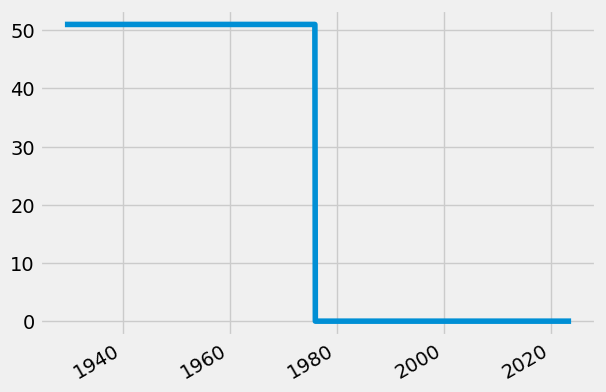

In [18]:
unemployment_states.isna().sum(axis=1).plot()

We can just choose to drop the missing values as **we have no way of collecting US unemployment rate data from the past that is gathered by the US Federal Reserve**.

The state names are pretty hard to read. A workaround for this would be to:

1. Remove the 'Unemployment Rate in' string from the `'title'` column
2. Use `.to_dict()` to make a hash map of the column names
3. Do list comprehension to take in the more readable names of the US states

In [19]:
unemployment_states = unemployment_states.dropna()
id_to_state = unemployment_df['title'].str.replace('Unemployment Rate in', '').to_dict()
unemployment_states.columns = [id_to_state[col] for col in unemployment_states.columns]

In [20]:
unemployment_states

,California,New York,Texas,Florida,Alabama,Illinois,North Carolina,Pennsylvania,Michigan,Ohio,New Jersey,Kentucky,Georgia,Minnesota,Massachusetts,New Mexico,Colorado,Virginia,Washington,Oregon,Maryland,Wisconsin,Alaska,Arkansas,South Carolina,West Virginia,Utah,Arizona,Tennessee,Indiana,Louisiana,Iowa,North Dakota,Nevada,Missouri,New Hampshire,Hawaii,Oklahoma,Mississippi,Montana,Nebraska,Kansas,the District of Columbia,Maine,Connecticut,Wyoming,Idaho,Delaware,South Dakota,Vermont,Rhode Island
1976-01-01,9.2,10.3,5.8,9.7,6.6,6.6,6.4,8.0,9.9,8.1,10.3,5.6,8.4,6.0,10.5,8.6,5.8,6.1,8.5,9.5,6.4,5.8,7.1,7.3,7.4,7.5,5.8,10.2,6.0,6.6,6.3,4.3,3.4,9.2,5.9,6.5,9.8,5.8,6.7,5.8,3.3,4.2,8.7,8.7,9.8,4.1,5.6,8.0,3.3,8.6,7.8
1976-02-01,9.2,10.3,5.8,9.7,6.6,6.6,6.4,8.1,9.9,8.1,10.3,5.6,8.4,6.0,10.5,8.7,5.7,6.1,8.5,9.5,6.4,5.8,7.1,7.3,7.4,7.5,5.9,10.2,6.0,6.6,6.3,4.3,3.4,9.2,5.9,6.5,9.8,5.8,6.7,5.8,3.3,4.2,8.7,8.7,9.8,4.1,5.6,8.0,3.3,8.6,7.8
1976-03-01,9.1,10.2,5.9,9.6,6.6,6.6,6.4,8.1,9.9,8.1,10.3,5.6,8.4,5.9,10.5,8.7,5.7,6.1,8.4,9.4,6.4,5.7,7.0,7.3,7.3,7.5,5.8,10.1,6.0,6.5,6.3,4.3,3.4,9.2,5.9,6.5,9.8,5.8,6.6,5.8,3.3,4.2,8.6,8.6,9.8,4.1,5.6,8.0,3.2,8.6,7.7
1976-04-01,9.1,10.2,5.9,9.5,6.5,6.6,6.3,8.1,9.8,8.0,10.3,5.6,8.3,5.8,10.3,8.6,5.6,6.0,8.5,9.2,6.4,5.6,6.9,7.2,7.2,7.5,5.8,10.0,6.0,6.3,6.4,4.2,3.5,9.0,6.0,6.5,9.7,5.8,6.4,5.8,3.2,4.2,8.5,8.6,9.6,4.0,5.6,8.1,3.1,8.6,7.7
1976-05-01,9.0,10.1,5.9,9.3,6.4,6.6,6.1,8.1,9.6,7.8,10.3,5.5,8.1,5.7,10.1,8.6,5.6,5.9,8.5,9.1,6.5,5.5,6.9,7.1,7.0,7.4,5.7,9.8,5.9,6.0,6.5,4.1,3.6,8.9,6.0,6.5,9.4,5.7,6.3,5.8,3.1,4.2,8.4,8.5,9.4,3.9,5.6,8.3,3.1,8.5,7.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-01,4.6,3.9,4.1,2.6,2.2,4.0,3.3,3.8,3.6,3.4,3.7,3.8,3.2,2.9,2.6,3.5,2.8,2.7,3.8,3.5,2.0,2.5,3.7,2.6,3.1,3.3,2.4,3.5,3.2,3.2,3.6,2.7,2.0,5.4,2.6,1.8,3.0,2.7,3.1,2.4,1.9,2.8,5.1,2.4,3.7,3.1,2.7,4.2,1.8,1.9,2.9
2023-07-01,4.6,3.9,4.1,2.7,2.1,4.0,3.3,3.5,3.6,3.3,3.9,3.9,3.2,3.0,2.5,3.6,2.9,2.5,3.6,3.4,1.8,2.6,3.8,2.6,3.1,3.4,2.4,3.6,3.1,3.3,3.4,2.7,2.0,5.3,2.7,1.7,2.8,2.7,3.0,2.5,2.0,2.7,5.0,2.4,3.6,3.0,2.8,4.1,1.9,1.8,2.8
2023-08-01,4.6,3.9,4.1,2.7,2.1,4.1,3.3,3.5,3.7,3.4,4.2,4.0,3.3,3.1,2.6,3.7,3.1,2.5,3.6,3.4,1.7,2.9,3.9,2.7,3.0,3.6,2.5,3.8,3.1,3.4,3.3,2.9,1.9,5.4,2.8,1.8,2.8,2.8,3.2,2.5,2.0,2.7,5.0,2.5,3.5,2.9,3.0,4.1,1.9,1.8,2.7
2023-09-01,4.7,4.0,4.1,2.8,2.2,4.4,3.4,3.4,3.9,3.4,4.4,4.1,3.4,3.1,2.6,3.7,3.2,2.5,3.6,3.5,1.6,3.1,4.1,2.9,2.9,3.8,2.6,4.0,3.2,3.6,3.3,3.0,1.9,5.4,2.9,2.0,2.8,3.0,3.2,2.7,2.1,2.8,5.0,2.7,3.5,2.9,3.1,4.1,1.9,1.9,2.6


We now have more **readable US State Columns**

# 3. Visualize Unemployment Rate by US State

Let us visualize **unemployment rates by US for every month over the years**. To make it interactive we'll make use of `plotly.express` which is an interactive graphing library for Python.

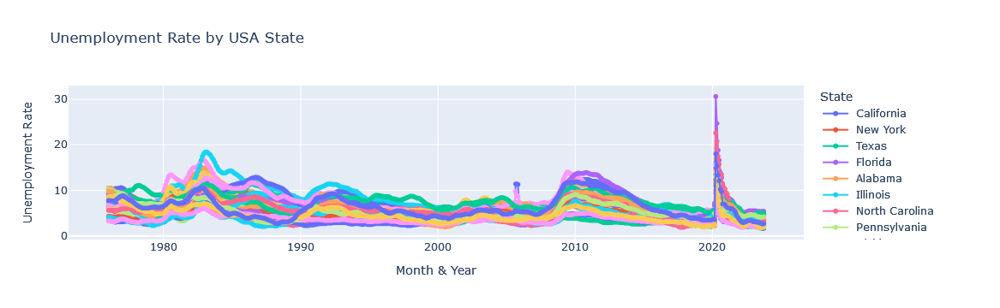

In [21]:
fig = px.line(data_frame=unemployment_states,
              title='Unemployment Rate by USA State',
              labels={
                  'index': 'Month & Year',
                  'value': 'Unemployment Rate',
                  'variable': 'State'
              },
              markers=True)

fig.show()

It can be seen that the most recent month and year where unemployment rate was at its peak occurred on **May 2020 (2020-05-01)**. Let's try pulling out the data from that time.

# 4. Pull May 2020 Unemployment Rate Data

In [22]:
unemployment_states.loc[unemployment_states.index == '2020-05-01']

,California,New York,Texas,Florida,Alabama,Illinois,North Carolina,Pennsylvania,Michigan,Ohio,New Jersey,Kentucky,Georgia,Minnesota,Massachusetts,New Mexico,Colorado,Virginia,Washington,Oregon,Maryland,Wisconsin,Alaska,Arkansas,South Carolina,West Virginia,Utah,Arizona,Tennessee,Indiana,Louisiana,Iowa,North Dakota,Nevada,Missouri,New Hampshire,Hawaii,Oklahoma,Mississippi,Montana,Nebraska,Kansas,the District of Columbia,Maine,Connecticut,Wyoming,Idaho,Delaware,South Dakota,Vermont,Rhode Island
2020-05-01,15.7,16.6,11.6,14.1,10.4,14.7,11.6,12.9,19.1,12.7,15.3,12.8,9.7,11.1,15.5,9.3,11.6,10.0,13.2,11.8,8.8,10.5,11.9,8.9,9.2,12.4,7.7,11.2,12.1,12.4,12.2,8.3,7.2,24.7,9.5,11.7,20.8,9.7,11.2,9.2,6.3,9.3,8.8,9.4,11.7,8.7,9.0,13.4,6.6,9.5,15.4


Using `.T` allows us to flip the columns and the rows. This way:

- the **US states become the index**
- the **specified date (May 01, 2020) becomes the column** 

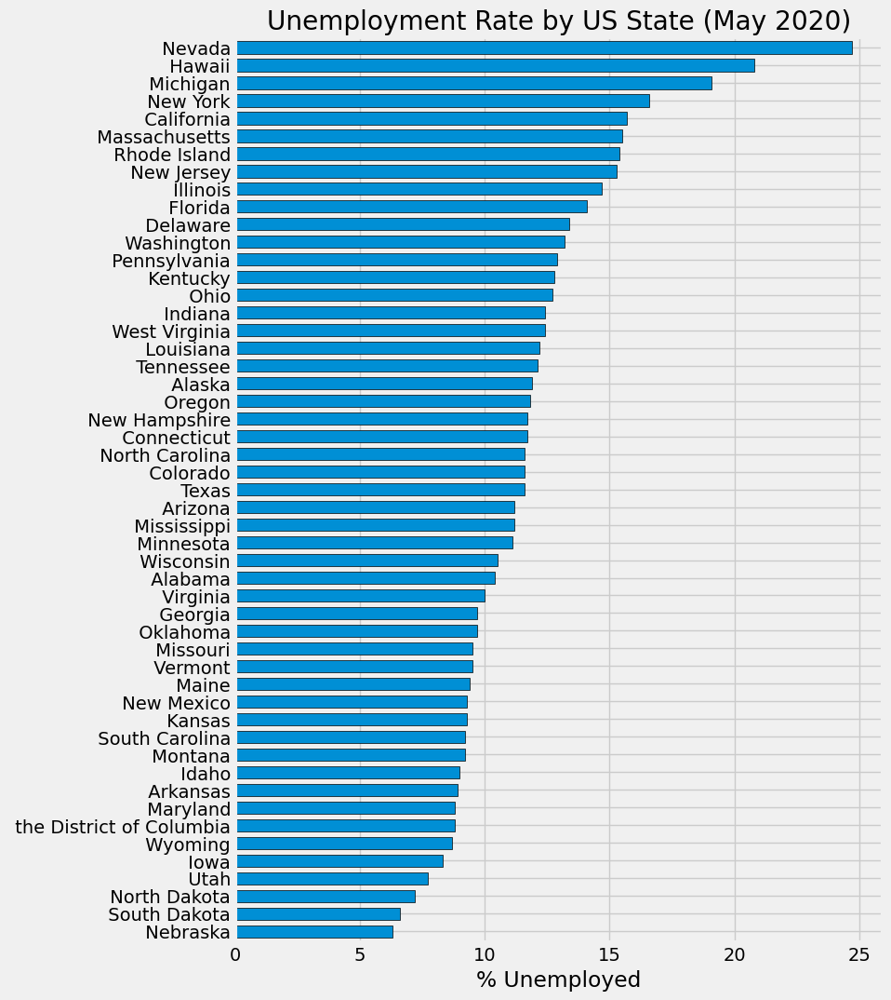

In [23]:
ax = unemployment_states.loc[unemployment_states.index == '2020-05-01'].T \
        .sort_values('2020-05-01') \
        .plot(kind='barh', figsize=(8, 12),
              xlabel='% Unemployed',
              edgecolor='black', width=0.7,
              title='Unemployment Rate by US State (May 2020)')

ax.legend().remove()

plt.show()

# III. Participation Rate Analysis

Now that we have unemployment rate data, let's **begin pulling participation rate data.**

# 1. Pull Participation Rate

In [24]:
participation_df = fred.search('participation rate state', filter=('frequency', 'Monthly'))
participation_df = participation_df.query('seasonal_adjustment == "Seasonally Adjusted" and ' +
                                          'units == "Percent"')

participation_df

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
CIVPART,CIVPART,2023-11-28,2023-11-28,Labor Force Participation Rate,1948-01-01,2023-10-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-11-03 07:50:02-05:00,82,The series comes from the 'Current Population ...
LNS11300060,LNS11300060,2023-11-28,2023-11-28,Labor Force Participation Rate - 25-54 Yrs.,1948-01-01,2023-10-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-11-03 07:50:11-05:00,65,The series comes from the 'Current Population ...
LNS11300002,LNS11300002,2023-11-28,2023-11-28,Labor Force Participation Rate - Women,1948-01-01,2023-10-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-11-03 07:50:09-05:00,65,To obtain estimates of women worker employment...
LNS11300001,LNS11300001,2023-11-28,2023-11-28,Labor Force Participation Rate - Men,1948-01-01,2023-10-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-11-03 07:50:14-05:00,55,The series comes from the 'Current Population ...
LNS11324230,LNS11324230,2023-11-28,2023-11-28,Labor Force Participation Rate - 55 Yrs. & over,1948-01-01,2023-10-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-11-03 07:50:20-05:00,49,The series comes from the 'Current Population ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LRINTTMAUSM156S,LRINTTMAUSM156S,2023-11-28,2023-11-28,Inactivity Rate: Aged 15 and over: Males for U...,1975-01-01,2023-10-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-11-17 12:00:43-06:00,1,OECD Descriptor ID: LRINTTMA OECD unit ID: PC ...
LRINTTFEUSM156S,LRINTTFEUSM156S,2023-11-28,2023-11-28,Inactivity Rate: Aged 15 and over: Females for...,1975-01-01,2023-10-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-11-17 12:00:43-06:00,1,OECD Descriptor ID: LRINTTFE OECD unit ID: PC ...
LRIN74TTUSM156S,LRIN74TTUSM156S,2023-11-28,2023-11-28,Inactivity Rate: Aged 15-74: All Persons for U...,1981-01-01,2023-10-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-11-17 12:38:08-06:00,0,OECD Descriptor ID: LRIN74TT OECD unit ID: PC ...


In [25]:
participation_id_to_state = participation_df['title'].str \
    .replace('Labor Force Participation Rate for', '') \
    .to_dict()

participation_id_to_state

{'CIVPART': 'Labor Force Participation Rate',
 'LNS11300060': 'Labor Force Participation Rate - 25-54 Yrs.',
 'LNS11300002': 'Labor Force Participation Rate - Women',
 'LNS11300001': 'Labor Force Participation Rate - Men',
 'LNS11324230': 'Labor Force Participation Rate - 55 Yrs. & over',
 'LNS11300012': 'Labor Force Participation Rate - 16-19 Yrs.',
 'LNS11300006': 'Labor Force Participation Rate - Black or African American',
 'LNS11300036': 'Labor Force Participation Rate - 20-24 Yrs.',
 'LRAC25MAUSM156S': 'Activity Rate: Aged 25-54: Males for United States',
 'LRAC25FEUSM156S': 'Activity Rate: Aged 25-54: Females for United States',
 'LBSSA06': ' California',
 'LBSSA01': ' Alabama',
 'LNS11327662': "Labor Force Participation Rate - Bachelor's Degree and Higher, 25 Yrs. & over",
 'LBSSA26': ' Michigan',
 'LBSSA12': ' Florida',
 'LBSSA55': ' Wisconsin',
 'LNS11300028': 'Labor Force Participation Rate - 20 Yrs. & over, White Men',
 'LNS11300031': 'Labor Force Participation Rate - 20 Yr

In [26]:
participation_all_results = []

for part_id in participation_df.index:
    participation_results = fred.get_series(part_id)
    participation_results = participation_results.to_frame(name=part_id)
    
    participation_all_results.append(participation_results)

In [27]:
participation_results = pd.concat(participation_all_results, axis=1)
participation_results

,CIVPART,LNS11300060,LNS11300002,LNS11300001,LNS11324230,LNS11300012,LNS11300006,LNS11300036,LRAC25MAUSM156S,LRAC25FEUSM156S,LBSSA06,LBSSA01,LNS11327662,LBSSA26,LBSSA12,LBSSA55,LNS11300028,LNS11300031,LNS11300003,LBSSA27,LBSSA36,LBSSA21,LNS11327660,LNS11300032,LBSSA48,LBSSA39,LBSSA28,LBSSA35,LNS11300026,LBSSA53,LBSSA23,LBSSA49,LBSSA17,LNS11300009,LRIN64TTUSM156S,LBSSA54,LBSSA47,LBSSA24,LBSSA25,LBSSA42,LBSSA37,LBSSA13,LBSSA22,LBSSA51,LBSSA45,LNS11300025,LBSSA15,LBSSA20,LBSSA05,LBSSA08,LBSSA33,LBSSA09,LNS11300029,LNS11327659,LBSSA29,LRAC64TTUSM156S,LBSSA31,LBSSA32,LBSSA04,LBSSA19,LBSSA18,LBSSA16,LBSSA34,LBSSA41,LBSSA40,LBSSA02,LNS11300018,LBSSA50,LBSSA44,LRAC55TTUSM156S,LNS11327689,LBSSA46,LBSSA30,LBSSA56,LBSSA38,LBSSA10,LNS11300015,LRIN25MAUSM156S,LRAC64FEUSM156S,LRAC24TTUSM156S,LRIN55TTUSM156S,LBSSA11,LRAC55MAUSM156S,LRAC24FEUSM156S,LRAC24MAUSM156S,LRAC55FEUSM156S,LRIN55MAUSM156S,LRIN24FEUSM156S,LRIN24MAUSM156S,LRIN55FEUSM156S,LRAC74MAUSM156S,LRAC74FEUSM156S,LRIN74FEUSM156S,LRIN74MAUSM156S,LRIN64MAUSM156S,LRIN64FEUSM156S,LRAC64MAUSM156S,LRIN25FEUSM156S,LRAC25TTUSM156S,LRIN24TTUSM156S,LRAC74TTUSM156S,LRIN25TTUSM156S,LRACTTMAUSM156S,LRACTTFEUSM156S,LRINTTMAUSM156S,LRINTTFEUSM156S,LRIN74TTUSM156S,LRINTTTTUSM156S,LRACTTTTUSM156S
1948-01-01,58.6,64.2,32.0,86.7,43.0,53.2,NaN,64.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,88.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1948-02-01,58.9,64.6,32.4,87.0,43.3,53.7,NaN,64.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,89.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1948-03-01,58.5,64.3,32.1,86.3,43.0,54.1,NaN,63.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,88.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1948-04-01,59.0,64.8,33.0,86.6,43.4,54.2,NaN,63.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,88.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1948-05-01,58.3,64.3,32.0,86.1,43.2,50.9,NaN,63.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,88.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-01,62.6,83.5,57.3,68.1,38.3

In [28]:
participation_df.loc['LBSSA06']

id                                                                     LBSSA06
realtime_start                                             2023-11-28 00:00:00
realtime_end                                               2023-11-28 00:00:00
title                            Labor Force Participation Rate for California
observation_start                                          1976-01-01 00:00:00
observation_end                                            2023-10-01 00:00:00
frequency                                                              Monthly
frequency_short                                                              M
units                                                                  Percent
units_short                                                                  %
seasonal_adjustment                                        Seasonally Adjusted
seasonal_adjustment_short                                                   SA
last_updated                                        

In [29]:
part_columns_to_drop = []

for col in participation_results.columns:
    if len(col) > 7:
        part_columns_to_drop.append(col)
        
part_columns_to_drop

['LNS11300060',
 'LNS11300002',
 'LNS11300001',
 'LNS11324230',
 'LNS11300012',
 'LNS11300006',
 'LNS11300036',
 'LRAC25MAUSM156S',
 'LRAC25FEUSM156S',
 'LNS11327662',
 'LNS11300028',
 'LNS11300031',
 'LNS11300003',
 'LNS11327660',
 'LNS11300032',
 'LNS11300026',
 'LNS11300009',
 'LRIN64TTUSM156S',
 'LNS11300025',
 'LNS11300029',
 'LNS11327659',
 'LRAC64TTUSM156S',
 'LNS11300018',
 'LRAC55TTUSM156S',
 'LNS11327689',
 'LNS11300015',
 'LRIN25MAUSM156S',
 'LRAC64FEUSM156S',
 'LRAC24TTUSM156S',
 'LRIN55TTUSM156S',
 'LRAC55MAUSM156S',
 'LRAC24FEUSM156S',
 'LRAC24MAUSM156S',
 'LRAC55FEUSM156S',
 'LRIN55MAUSM156S',
 'LRIN24FEUSM156S',
 'LRIN24MAUSM156S',
 'LRIN55FEUSM156S',
 'LRAC74MAUSM156S',
 'LRAC74FEUSM156S',
 'LRIN74FEUSM156S',
 'LRIN74MAUSM156S',
 'LRIN64MAUSM156S',
 'LRIN64FEUSM156S',
 'LRAC64MAUSM156S',
 'LRIN25FEUSM156S',
 'LRAC25TTUSM156S',
 'LRIN24TTUSM156S',
 'LRAC74TTUSM156S',
 'LRIN25TTUSM156S',
 'LRACTTMAUSM156S',
 'LRACTTFEUSM156S',
 'LRINTTMAUSM156S',
 'LRINTTFEUSM156S',
 'LR

In [30]:
participation_states = participation_results \
    .drop(columns=part_columns_to_drop, axis=1) \
    .drop(columns='CIVPART', axis=1)

participation_states

,LBSSA06,LBSSA01,LBSSA26,LBSSA12,LBSSA55,LBSSA27,LBSSA36,LBSSA21,LBSSA48,LBSSA39,LBSSA28,LBSSA35,LBSSA53,LBSSA23,LBSSA49,LBSSA17,LBSSA54,LBSSA47,LBSSA24,LBSSA25,LBSSA42,LBSSA37,LBSSA13,LBSSA22,LBSSA51,LBSSA45,LBSSA15,LBSSA20,LBSSA05,LBSSA08,LBSSA33,LBSSA09,LBSSA29,LBSSA31,LBSSA32,LBSSA04,LBSSA19,LBSSA18,LBSSA16,LBSSA34,LBSSA41,LBSSA40,LBSSA02,LBSSA50,LBSSA44,LBSSA46,LBSSA30,LBSSA56,LBSSA38,LBSSA10,LBSSA11
1948-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1948-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1948-03-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1948-04-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1948-05-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-01,62.5,57.0,60.7,59.5,65.3,68.4,61.2,57.8,64.2,62.2,54.5,57.0,64.7,58.4,69.6,64.6,54.6,59.3,65.3,64.6,62.0,60.7,61.3,59.5,66.6,56.7,60.4,66.8,57.6,68.7,65.2,64.1,63.6,69.5,61.5,61.7,68.7,63.6,62.5,65.4,62.0,61.4,65.3,63.8,63.2,67.9,62.8,64.6,69.7,60.0,70.8
2023-07-01,62.4,57.0,61.0,59.7,65.5,68.5,61.4,57.7,64.2,62.1,54.4,57.1,64.7,58.5,69.8,64.4,54.7,59.4,65.3,64.5,61.9,60.7,61.4,59.3,66.7,56.9,60.3,66.8,57.7,68.7,64.9,64.1,63.6,69.4,61.6,61.8,68.8,63.6,62.4,65.5,61.8,61.6,65.2,63.9,63.3,67.8,62.7,64.6,69.7,60.1,70.8
2023-08-01,62.4,57.0,61.3,59.7,65.7,68.5,61.5,57.6,64.2,62.1,54.3,57.2,64.6,58.6,69.8,64.4,54.9,59.4,65.3,64.5,61.9,60.8,61.4,59.0,66.7,57.0,60.2,66.7,57.7,68.7,64.6,64.1,63.7,69.2,61.7,61.8,68.7,63.5,62.4,65.5,61.7,61.8,65.2,64.0,63.3,67.8,62.7,64.5,69.5,60.3,70.9
2023-09-01,62.3,57.0,61.6,59.8,65.8,68.5,61.6,57.4,64.2,62.1,54.1,57.2,64.5,58.7,69.7,64.5,55.1,59.4,65.2,64.4,61.9,60.9,61.5,58.9,66.8,57.0,60.2,66.7,57.8,68.6,64.6,64.1,63.7,69.2,61.9,61.9,68.6,63.4,62.4,65.4,61.7,62.1,65.2,64.1,63.4,67.8,62.6,64.4,69.3,60.5,71.1


In [31]:
for index, col in enumerate(participation_states.columns):
    print(index, col)

0 LBSSA06
1 LBSSA01
2 LBSSA26
3 LBSSA12
4 LBSSA55
5 LBSSA27
6 LBSSA36
7 LBSSA21
8 LBSSA48
9 LBSSA39
10 LBSSA28
11 LBSSA35
12 LBSSA53
13 LBSSA23
14 LBSSA49
15 LBSSA17
16 LBSSA54
17 LBSSA47
18 LBSSA24
19 LBSSA25
20 LBSSA42
21 LBSSA37
22 LBSSA13
23 LBSSA22
24 LBSSA51
25 LBSSA45
26 LBSSA15
27 LBSSA20
28 LBSSA05
29 LBSSA08
30 LBSSA33
31 LBSSA09
32 LBSSA29
33 LBSSA31
34 LBSSA32
35 LBSSA04
36 LBSSA19
37 LBSSA18
38 LBSSA16
39 LBSSA34
40 LBSSA41
41 LBSSA40
42 LBSSA02
43 LBSSA50
44 LBSSA44
45 LBSSA46
46 LBSSA30
47 LBSSA56
48 LBSSA38
49 LBSSA10
50 LBSSA11


# 2. Checking for missing values

<Axes: >

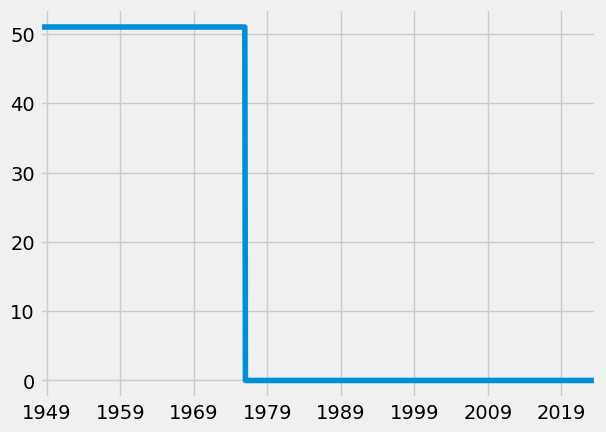

In [32]:
participation_states.isna().sum(axis=1).plot()

In [33]:
participation_states = participation_states.dropna()
participation_states.columns = [participation_id_to_state[col] for col in participation_states.columns]

In [34]:
participation_states

,California,Alabama,Michigan,Florida,Wisconsin,Minnesota,New York,Kentucky,Texas,Ohio,Mississippi,New Mexico,Washington,Maine,Utah,Illinois,West Virginia,Tennessee,Maryland,Massachusetts,Pennsylvania,North Carolina,Georgia,Louisiana,Virginia,South Carolina,Hawaii,Kansas,Arkansas,Colorado,New Hampshire,Connecticut,Missouri,Nebraska,Nevada,Arizona,Iowa,Indiana,Idaho,New Jersey,Oregon,Oklahoma,Alaska,Vermont,Rhode Island,South Dakota,Montana,Wyoming,North Dakota,Delaware,District Of Columbia
1976-01-01,62.6,57.0,61.6,55.8,65.6,65.6,58.0,60.5,63.8,61.7,58.8,60.8,60.9,62.1,62.8,63.0,52.5,59.6,64.3,64.8,58.4,66.5,63.7,56.8,65.9,65.3,69.9,65.1,57.9,67.2,65.9,64.2,60.5,64.9,71.3,59.5,64.4,64.0,63.0,61.5,62.9,59.3,69.0,63.6,63.8,64.6,62.7,65.3,62.6,62.7,64.4
1976-02-01,62.4,56.9,61.5,55.7,65.5,65.5,58.0,60.3,63.5,61.7,58.6,60.5,60.7,61.9,62.6,63.0,52.4,59.4,64.2,64.7,58.3,66.3,63.6,56.6,65.8,65.2,69.6,65.0,57.8,67.0,65.6,64.1,60.3,64.9,70.8,59.2,64.3,63.9,62.8,61.4,62.7,59.2,68.4,63.4,63.7,64.4,62.5,64.9,62.4,62.5,64.5
1976-03-01,62.2,56.8,61.5,55.5,65.4,65.4,58.0,60.2,63.4,61.7,58.5,60.3,60.6,61.9,62.5,62.9,52.3,59.3,64.1,64.6,58.3,66.2,63.5,56.5,65.6,65.0,69.6,64.9,57.7,66.8,65.6,64.0,60.3,64.8,70.5,59.1,64.2,63.8,62.7,61.4,62.5,59.1,67.8,63.2,63.6,64.4,62.4,64.7,62.3,62.5,64.5
1976-04-01,62.2,56.8,61.6,55.5,65.4,65.4,58.0,60.1,63.5,61.6,58.5,60.3,60.6,61.8,62.5,62.9,52.3,59.3,64.1,64.6,58.3,66.2,63.5,56.4,65.5,64.9,69.4,65.0,57.7,66.6,65.7,64.1,60.4,64.8,70.4,59.1,64.1,63.8,62.7,61.5,62.4,59.0,67.9,63.5,63.7,64.3,62.3,64.9,62.5,62.4,64.5
1976-05-01,62.3,56.8,61.7,55.4,65.5,65.5,58.1,60.1,63.6,61.6,58.5,60.3,60.7,61.7,62.6,63.0,52.2,59.4,64.1,64.6,58.3,66.3,63.6,56.4,65.4,64.7,69.3,65.1,57.7,66.5,66.0,64.3,60.6,64.8,70.5,59.1,64.1,63.9,62.8,61.6,62.5,59.0,67.9,63.6,63.6,64.3,62.2,65.2,62.6,62.4,64.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-01,62.5,57.0,60.7,59.5,65.3,68.4,61.2,57.8,64.2,62.2,54.5,57.0,64.7,58.4,69.6,64.6,54.6,59.3,65.3,64.6,62.0,60.7,61.3,59.5,66.6,56.7,60.4,66.8,57.6,68.7,65.2,64.1,63.6,69.5,61.5,61.7,68.7,63.6,62.5,65.4,62.0,61.4,65.3,63.8,63.2,67.9,62.8,64.6,69.7,60.0,70.8
2023-07-01,62.4,57.0,61.0,59.7,65.5,68.5,61.4,57.7,64.2,62.1,54.4,57.1,64.7,58.5,69.8,64.4,54.7,59.4,65.3,64.5,61.9,60.7,61.4,59.3,66.7,56.9,60.3,66.8,57.7,68.7,64.9,64.1,63.6,69.4,61.6,61.8,68.8,63.6,62.4,65.5,61.8,61.6,65.2,63.9,63.3,67.8,62.7,64.6,69.7,60.1,70.8
2023-08-01,62.4,57.0,61.3,59.7,65.7,68.5,61.5,57.6,64.2,62.1,54.3,57.2,64.6,58.6,69.8,64.4,54.9,59.4,65.3,64.5,61.9,60.8,61.4,59.0,66.7,57.0,60.2,66.7,57.7,68.7,64.6,64.1,63.7,69.2,61.7,61.8,68.7,63.5,62.4,65.5,61.7,61.8,65.2,64.0,63.3,67.8,62.7,64.5,69.5,60.3,70.9
2023-09-01,62.3,57.0,61.6,59.8,65.8,68.5,61.6,57.4,64.2,62.1,54.1,57.2,64.5,58.7,69.7,64.5,55.1,59.4,65.2,64.4,61.9,60.9,61.5,58.9,66.8,57.0,60.2,66.7,57.8,68.6,64.6,64.1,63.7,69.2,61.9,61.9,68.6,63.4,62.4,65.4,61.7,62.1,65.2,64.1,63.4,67.8,62.6,64.4,69.3,60.5,71.1


# 3. Visualize Participation Rate by US State

This time, we visualize **participation rates by US for every month over the years**.

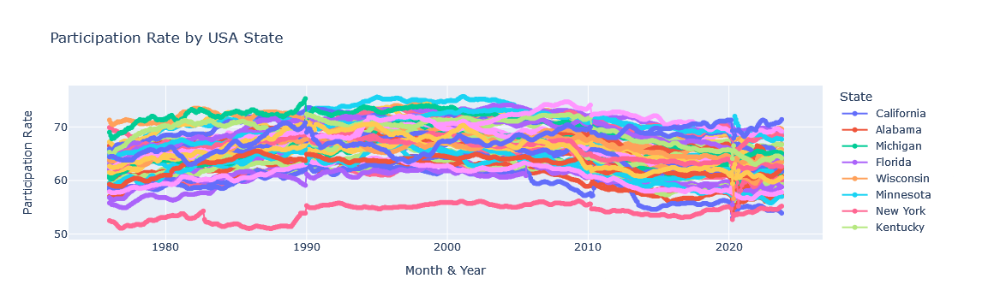

In [35]:
fig = px.line(data_frame=participation_states,
              title='Participation Rate by USA State',
              labels={
                  'index': 'Month & Year',
                  'value': 'Participation Rate',
                  'variable': 'State'
              },
              markers=True)

fig.show()

Unlike the unemployment rate, **we now see drops in labor participation rate in May 2020.** Let's try to pull the labor participation rate during this time.

# 4. Pull May 2020 Unemployment Rate Data

In [36]:
participation_states.loc[participation_states.index == '2020-05-01']

,California,Alabama,Michigan,Florida,Wisconsin,Minnesota,New York,Kentucky,Texas,Ohio,Mississippi,New Mexico,Washington,Maine,Utah,Illinois,West Virginia,Tennessee,Maryland,Massachusetts,Pennsylvania,North Carolina,Georgia,Louisiana,Virginia,South Carolina,Hawaii,Kansas,Arkansas,Colorado,New Hampshire,Connecticut,Missouri,Nebraska,Nevada,Arizona,Iowa,Indiana,Idaho,New Jersey,Oregon,Oklahoma,Alaska,Vermont,Rhode Island,South Dakota,Montana,Wyoming,North Dakota,Delaware,District Of Columbia
2020-05-01,59.5,57.4,60.6,58.0,65.8,69.2,58.0,58.5,62.7,60.8,53.5,54.9,65.1,59.6,67.8,62.3,53.6,59.8,65.9,64.9,61.9,58.1,61.1,56.5,63.5,57.4,59.0,66.6,57.6,67.7,66.8,65.7,59.6,69.7,56.6,61.0,66.4,62.4,63.3,62.0,61.1,60.4,63.5,63.5,63.7,68.7,62.9,66.5,68.6,62.4,67.9


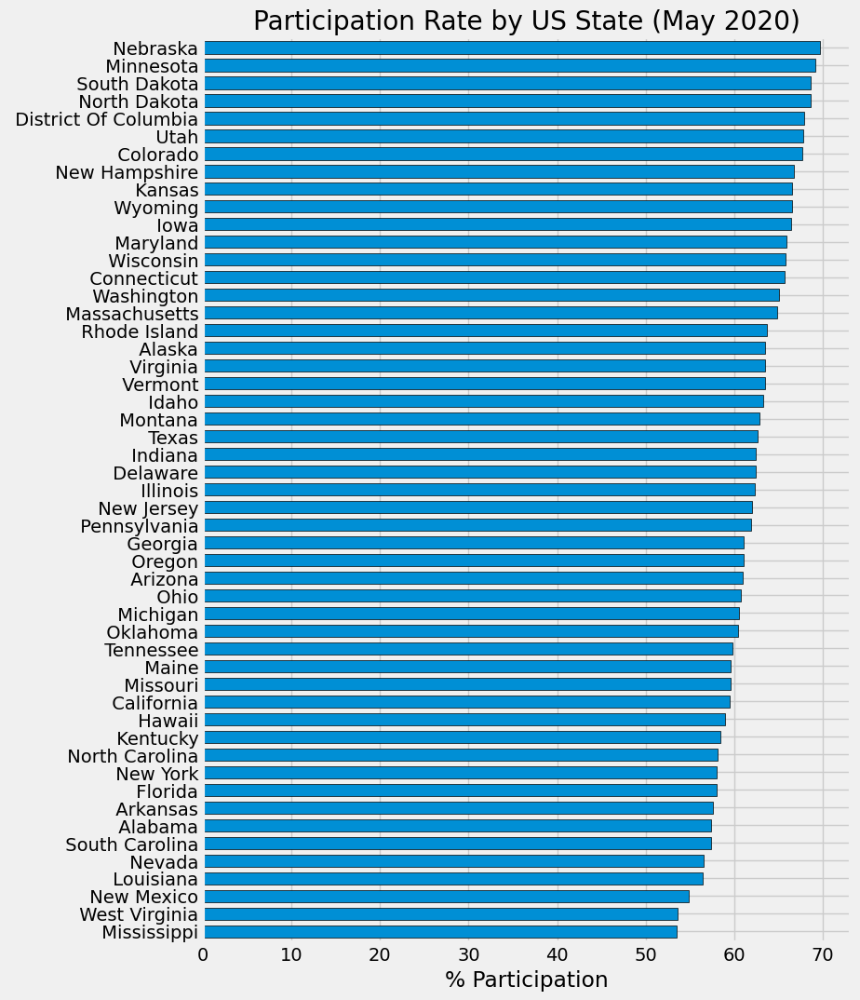

In [37]:
ax = participation_states.loc[participation_states.index == '2020-05-01'].T \
        .sort_values('2020-05-01') \
        .plot(kind='barh', figsize=(8, 12),
              xlabel='% Participation',
              edgecolor='black', width=0.7,
              title='Participation Rate by US State (May 2020)')

ax.legend().remove()

plt.show()

# III. Visualize Unemployment Rate vs. Participation Rate

In [38]:
unemployment_states.columns = unemployment_states.columns.str.strip()
unemployment_states = unemployment_states.rename(columns={'the District of Columbia': 'District of Columbia'})
unemployment_states.columns

Index(['California', 'New York', 'Texas', 'Florida', 'Alabama', 'Illinois',
       'North Carolina', 'Pennsylvania', 'Michigan', 'Ohio', 'New Jersey',
       'Kentucky', 'Georgia', 'Minnesota', 'Massachusetts', 'New Mexico',
       'Colorado', 'Virginia', 'Washington', 'Oregon', 'Maryland', 'Wisconsin',
       'Alaska', 'Arkansas', 'South Carolina', 'West Virginia', 'Utah',
       'Arizona', 'Tennessee', 'Indiana', 'Louisiana', 'Iowa', 'North Dakota',
       'Nevada', 'Missouri', 'New Hampshire', 'Hawaii', 'Oklahoma',
       'Mississippi', 'Montana', 'Nebraska', 'Kansas', 'District of Columbia',
       'Maine', 'Connecticut', 'Wyoming', 'Idaho', 'Delaware', 'South Dakota',
       'Vermont', 'Rhode Island'],
      dtype='object')

In [39]:
participation_states.columns = participation_states.columns.str.strip()
participation_states.columns

Index(['California', 'Alabama', 'Michigan', 'Florida', 'Wisconsin',
       'Minnesota', 'New York', 'Kentucky', 'Texas', 'Ohio', 'Mississippi',
       'New Mexico', 'Washington', 'Maine', 'Utah', 'Illinois',
       'West Virginia', 'Tennessee', 'Maryland', 'Massachusetts',
       'Pennsylvania', 'North Carolina', 'Georgia', 'Louisiana', 'Virginia',
       'South Carolina', 'Hawaii', 'Kansas', 'Arkansas', 'Colorado',
       'New Hampshire', 'Connecticut', 'Missouri', 'Nebraska', 'Nevada',
       'Arizona', 'Iowa', 'Indiana', 'Idaho', 'New Jersey', 'Oregon',
       'Oklahoma', 'Alaska', 'Vermont', 'Rhode Island', 'South Dakota',
       'Montana', 'Wyoming', 'North Dakota', 'Delaware',
       'District Of Columbia'],
      dtype='object')

In [40]:
print(color_pal[0], color_pal[1])

#008fd5 #fc4f30


The hex codes that will be used for the plot between Unemployment Rate and Participation Rate are:

- `#008fd5` : **Unemployment Rate (Blue)**
- `#fc4f30` : **Participation Rate (Red)**

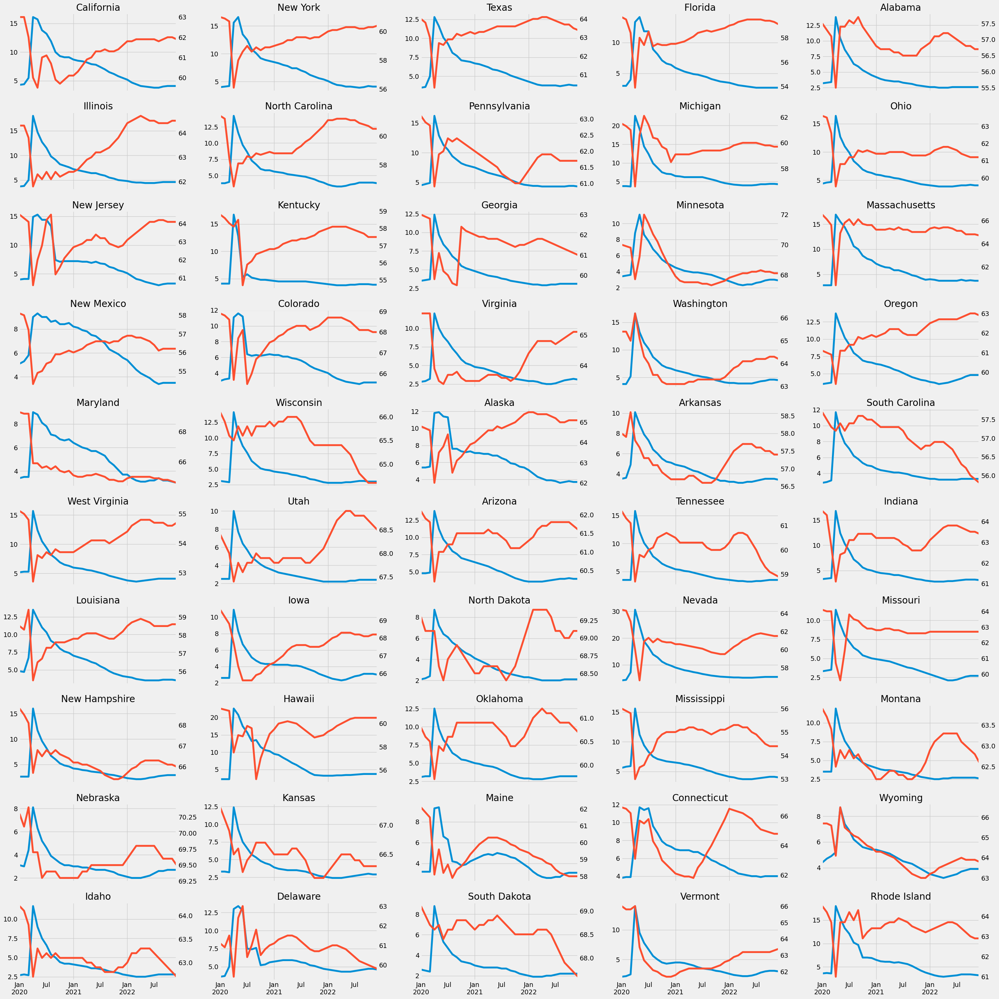

In [41]:
fig, axs = plt.subplots(10, 5, figsize=(30, 30), sharex=True)
axs = axs.flatten()

i = 0
for state in unemployment_states.columns:
    if state == 'District of Columbia':
        continue
        
    ax2 = axs[i].twinx()

    unemployment_states.query('index >= 2020 and index < 2023')[state] \
        .plot(ax=axs[i], label='Unemployment Rate')

    participation_states.query('index >= 2020 and index < 2023')[state] \
        .plot(ax=ax2, label='Participation Rate', color=color_pal[1])

    ax2.grid(False)
    axs[i].set_title(state)
    i += 1
    
plt.tight_layout()
plt.show()

# Conclusion

Based on the final visualization, we can conclude a number of things:

- It is safe to conclude that **as unemployment rate skyrocketed during May 2020, participation rate plummeted**.
    - This is around the time when the COVID-19 Outbreak started booming, not just affecting healthcare, but every industry and household worldwide.
- Over time, **participation rate increased as unemployment rate decreased.**
- Some US States (e.g., Tennessee Montana, Maine, Idaho, Delaware, South Dakota) **seem to not follow the general trend**
    - There might be some other economic factors affecting the participation rates of these states. Should the analysis of this economic data continues, this is something worth investigating.

# References

- Rob Mulla. (2022, April 26). _Economic Data Analysis Project with Python Pandas - Data scraping, cleaning and exploration!_ [Video]. YouTube. Retrieved November 22, 2023, from https://youtu.be/R67XuYc9NQ4?si=p0G707HjUCH6r1W-
- _St. Louis Fed Web Services: FRED® API_. (2009). Retrieved November 22, 2023, https://fred.stlouisfed.org/docs/api/fred/